In [6]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from tifffile import memmap, imwrite

from caImageAnalysis import BrukerFish
from caImageAnalysis.utils import fix_phase_offset
from caImageAnalysis.visualize import visualize_images, visualize_plane_over_time_mpl

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Change the exp_folder to the path of the experiment

In [7]:
# Change this path to the experiment folder
exp_folder = r'/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527'
region = ''

In [8]:
# Initialize BrukerFish
fish = BrukerFish(exp_folder, region=region)
fish.data_paths

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:194: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 194 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/Users/minelarinel/mambaforge/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pars

{'raw': PosixPath('/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527/anatomystack-000'),
 'raw_image': PosixPath('/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527/planes1-5_ch2.tif'),
 'frametimes': PosixPath('/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527/planes1-5_frametimes.txt'),
 'anatomy': None,
 'log': PosixPath('/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527/anatomystack-000/anatomystack-000.xml'),
 'references': PosixPath('/Volumes/DOI/Bruker/elavl3H2BGCaMP8m_6dpf_DOI_50ugml_24_20240527/anatomystack-000/References')}

In [9]:
# Load the full image
img = memmap(fish.data_paths['raw_image'])

## Visualize image to find the range to fix

In [16]:
iw = visualize_images(imgs=img)

iw.show()

RFBOutputContext()

In [11]:
iw.plot.canvas.close()

No such comm: 1de3b68ce06b4a638a6af35e10578294
No such comm: 1de3b68ce06b4a638a6af35e10578294


In [17]:
# Enter the index range to fix
# Includes start and stop
fix_range = [700, 800]

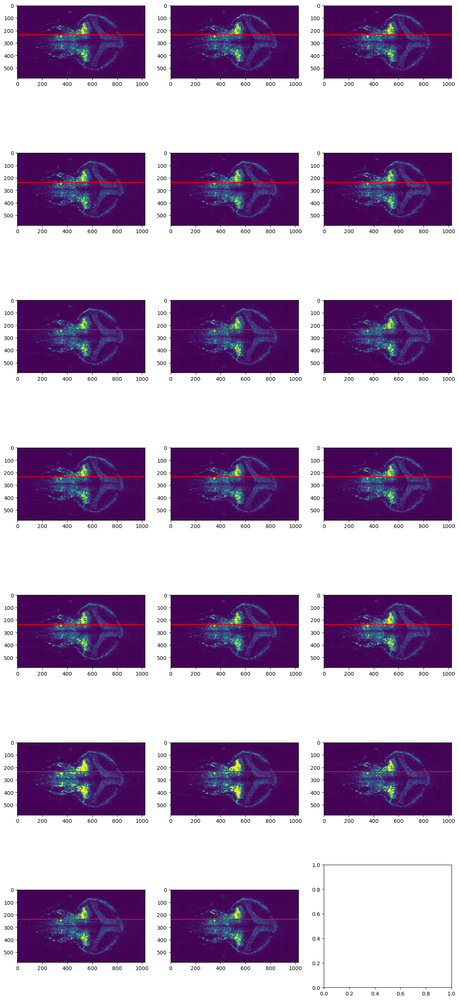

In [48]:
# Visualize a plane over time
plane = 4
img_row = 235

plane_indices = visualize_plane_over_time_mpl(fish, plane, 5, frame_range=fix_range, vmin=0, vmax=47.9, img_row=img_row)


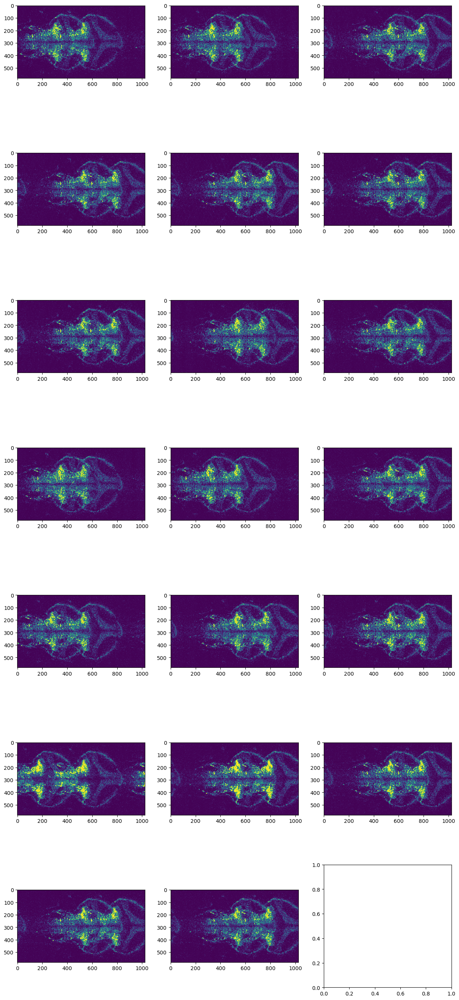

In [49]:
fixed_imgs = fix_phase_offset(img[plane_indices, :, :], img_row, n_cols=3, show_phase_plots=False, show_updated_plots=True, show_difference_plots=False)

In [36]:
# If the phase correction looks good, change the original image
for i, val in enumerate(plane_indices):
    img[val, :, :] = fixed_imgs[i, :, :]

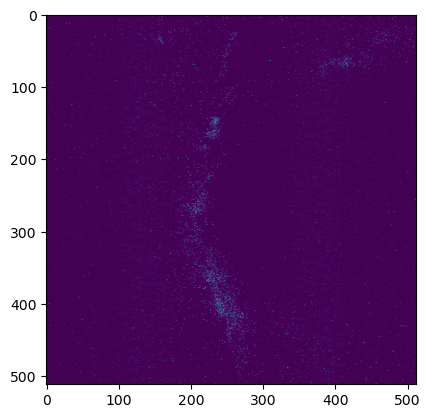

In [37]:
# Save the image
if len(fish.region) > 0:
	ch_image_path = Path(os.path.join(fish.exp_path, f'{fish.region}_ch2.tif'))
else:
	ch_image_path = Path(os.path.join(fish.exp_path, 'ch2.tif'))

if os.path.exists(ch_image_path):
	os.remove(ch_image_path)

imwrite(ch_image_path, img, bigtiff=True)
fish.data_paths['raw_image'] = ch_image_path

plt.imshow(img[0])

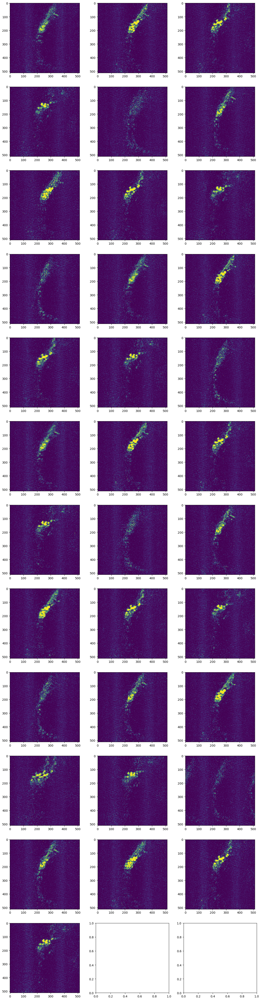

In [41]:
# Visualize all the frames from all the planes
n_images = fix_range[1] - fix_range[0] + 1
n_cols = 3

fig, ax = plt.subplots(int(n_images / n_cols)+1, n_cols, figsize=(5*n_cols, np.ceil(n_images / n_cols) * 5))

for i in range(n_images):
	row = int(i / 3)
	col = i % 3

	ax[row, col].imshow(img[fix_range[0]+i], vmin=0, vmax=27.9)